### Made by 

 --- 

 Simone Mingels (i6257567) and Sanne Vergouwen (i6270885)

# Introduction

In the past years COVID affected people all over the world. We, Sanne and Simone, want to explore how money influenced cases of covid and vaccination rates all over the globe. We will do this using the following research questions:

## Research question

- What effect does the wealth have on vaccination rate of a country?

### Sub questions

- Which countries have the highest / lowest GDP?
- Which countries have the highest / lowest vaccination rate?
- Which countries have the highest / lowest testing rate?
- Is there a correlation between the different income classes and vaccination rate?
- How do different income classes handle vaccinations?

# Preparation 

We first import the necessary libraries and load the data.

In [1]:
%matplotlib inline
import altair as alt
import pandas as pd
import ipywidgets as widgets
from ipywidgets import AppLayout, interact, fixed
import matplotlib.pyplot as plt
import numpy as np
import datetime

# Read in the data

We read in the csv file from [ourworldindata.org](https://ourworldindata.org/) from the assignment.

In [2]:
df = pd.read_csv("https://covid.ourworldindata.org/data/owid-covid-data.csv", parse_dates=['date'])

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (33) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


We first look at all the columns to give us an idea of what data there is available.

In [3]:
df.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

After looking at these columns we can see that there are some intresting columns that we can use to start looking at our research questions. We keep the following columns in our analysis:

- location
- date
- total_cases
- new_cases_smoothed
- total_cases_per_million
- new_cases_per_million
- new_cases_smoothed_per_million
- total_tests
- new_tests
- total_tests_per_thousand
- new_tests_per_thousand
- new_tests_smoothed
- new_tests_smoothed_per_thousand
- positive_rate
- tests_per_case
- tests_units
- total_vaccinations
- people_vaccinated
- people_fully_vaccinated
- total_boosters
- new_vaccinations
- new_vaccinations_smoothed
- total_vaccinations_per_hundred
- people_vaccinated_per_hundred
- people_fully_vaccinated_per_hundred
- total_boosters_per_hundred
- new_vaccinations_smoothed_per_million
- new_people_vaccinated_smoothed
- new_people_vaccinated_smoothed_per_hundred
- gdp_per_capita 
- extreme_poverty 
- human_development_index 
- population

In [4]:
keep_fields = [
    "iso_code",
    "location", 
    "date", 
    "total_cases", 
    "new_cases_smoothed",  
    "total_cases_per_million", 
    "new_cases_per_million", 
    "new_cases_smoothed_per_million", 
    "total_tests", 
    "new_tests", 
    "total_tests_per_thousand", 
    "new_tests_per_thousand", 
    "new_tests_smoothed", 
    "new_tests_smoothed_per_thousand", 
    "positive_rate", 
    "tests_per_case", 
    "tests_units", 
    "total_vaccinations", 
    "people_vaccinated", 
    "people_fully_vaccinated", 
    "total_boosters", 
    "new_vaccinations", 
    "new_vaccinations_smoothed", 
    "total_vaccinations_per_hundred", 
    "people_vaccinated_per_hundred",
    "people_fully_vaccinated_per_hundred",
     "total_boosters_per_hundred", 
     "new_vaccinations_smoothed_per_million", 
     "new_people_vaccinated_smoothed", 
     "new_people_vaccinated_smoothed_per_hundred", 
     "gdp_per_capita", 
     "extreme_poverty", 
     "human_development_index",
     "population"
]

df = df[keep_fields]

# Missing values

Now, there are a lot of columns, but it is also important to see how many missing values there are in each column. This is important because we want to make sure that we are not using columns that have a lot of missing values to make sure our analysis is not biased or invalid.

Since we are looking at GDP being a factor, we can also hypothesize that the countries that have the highest GDP will also have better reporting of their data. This is because they have more resources to do so. See the end of section 'GDP'

In [5]:
len(df)

262192

This number is the number of data entries. This number goes up as more data gets reported over time

In [6]:
df.isna().sum().sort_values(ascending=False)

total_boosters_per_hundred                    220925
total_boosters                                220925
new_vaccinations                              202236
people_fully_vaccinated_per_hundred           195090
people_fully_vaccinated                       195090
people_vaccinated                             192759
people_vaccinated_per_hundred                 192759
total_vaccinations                            189659
total_vaccinations_per_hundred                189659
new_tests                                     186789
new_tests_per_thousand                        186789
total_tests                                   182805
total_tests_per_thousand                      182805
tests_per_case                                167844
positive_rate                                 166265
new_tests_smoothed_per_thousand               158227
new_tests_smoothed                            158227
tests_units                                   155404
extreme_poverty                               

Here we count the missing values per column

We can see that there are a lot of missing values, so we will drop the columns that have more than 50% missing values. A bit of a subjective number, but we have the feeling that this will make our analysis more accurate.

In [7]:
df.isna().sum().sort_values(ascending=False) / len(df)

total_boosters_per_hundred                    0.842608
total_boosters                                0.842608
new_vaccinations                              0.771328
people_fully_vaccinated_per_hundred           0.744073
people_fully_vaccinated                       0.744073
people_vaccinated                             0.735183
people_vaccinated_per_hundred                 0.735183
total_vaccinations                            0.723359
total_vaccinations_per_hundred                0.723359
new_tests                                     0.712413
new_tests_per_thousand                        0.712413
total_tests                                   0.697218
total_tests_per_thousand                      0.697218
tests_per_case                                0.640157
positive_rate                                 0.634135
new_tests_smoothed_per_thousand               0.603478
new_tests_smoothed                            0.603478
tests_units                                   0.592711
extreme_po

In [8]:
x = df.isna().sum().sort_values(ascending=False) / len(df)
x = x[x > 0.5].index
df = df.drop(x, axis=1)

In [9]:
df.isna().sum().sort_values(ascending=False) / len(df)

extreme_poverty                               0.475804
new_people_vaccinated_smoothed                0.398548
new_people_vaccinated_smoothed_per_hundred    0.398548
new_vaccinations_smoothed                     0.398246
new_vaccinations_smoothed_per_million         0.398246
human_development_index                       0.214175
gdp_per_capita                                0.194781
new_cases_smoothed_per_million                0.065666
new_cases_smoothed                            0.061398
new_cases_per_million                         0.061093
total_cases_per_million                       0.059773
total_cases                                   0.055486
population                                    0.004287
iso_code                                      0.000000
location                                      0.000000
date                                          0.000000
dtype: float64

There is not enough data available concerning the testing, so we won't continue this topic within our research. 

# Looking at the data

Now that we have cleaned up the data a bit, we can start looking at the data.

Here we can see that the data is grouped by country basis and that the data is sorted by date. To give us a better idea we will look at the countries with the highest cases.

<AxesSubplot:xlabel='location'>

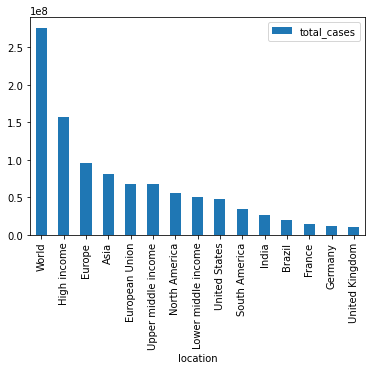

In [10]:
df.groupby('location').mean(numeric_only=True).sort_values(by='total_cases', ascending=False).head(15).plot(kind='bar', y='total_cases')

Here we can see something dangerous, some locations are not countries, but groups of countries (like world, high incone, Upper middle income, lower middle income, Low income and continents)

In [11]:
df = df[~df['location'].isin(['World', 'Asia', 'Europe', 'North America', 'South America', 'Africa', 'Oceania', 'European Union'])]

<AxesSubplot:xlabel='location'>

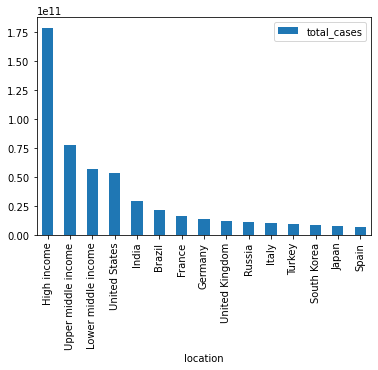

In [12]:
df.groupby('location').sum(numeric_only=True).sort_values(by='total_cases', ascending=False).head(15).plot(kind='bar', y='total_cases')

From here on we filtered out the outliers mentioned before. We decided to keep the categories concerning income levels, since we will need it to answer our research question

In [13]:
grouped_df = df[df.location.isin(['World', 'High income', 'Upper middle income', 'Lower middle income', 'Low income'])].reset_index()


<AxesSubplot:xlabel='location'>

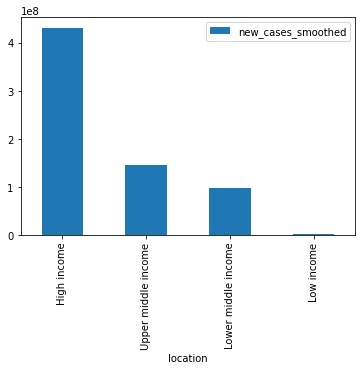

In [14]:
grouped_df.groupby('location').sum(numeric_only=True).sort_values(by='new_cases_smoothed', ascending=False).plot(kind='bar', y='new_cases_smoothed')

Here we show the income classes and the sum of cases. We concluded here that we don't know which countries belong to which income classes, because we cannot retrace this in the database. In order to answer our subquestion, we will make our own clases.

# GDP  

Usually they use GNI (gross national income) in order to calculate the income level of a country. However this information is not available within the given database, so we take the second best way to classify it, by using the GDP (Gross domestic product). The higher the GDP, the higher income the country, which can also indicate a higher standard of living.



Because GDP had some missing values this means there are also some countries we dont have any GDP data on.

<AxesSubplot:ylabel='location'>

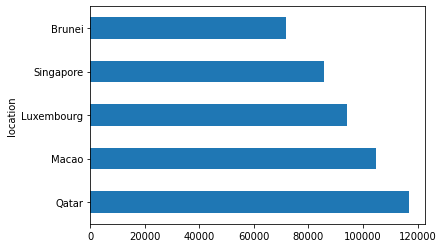

In [15]:
df.groupby('location').mean().gdp_per_capita.sort_values(ascending=False).head(5).plot(kind='barh')

These are the top 5 countries in the world with the highest GDP per capita

<AxesSubplot:ylabel='location'>

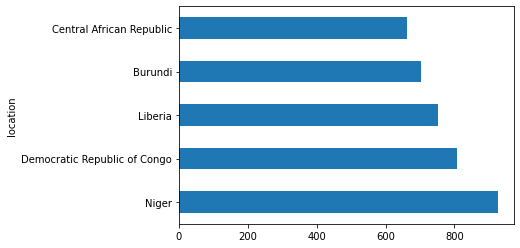

In [16]:
df.groupby('location').mean().gdp_per_capita.sort_values(ascending=False).dropna().tail(5).plot(kind='barh')

These 5 countries have the lowest GDP per capita of the world. 

In [17]:
max_gdp = df['gdp_per_capita'].max()
df['test_income_class'] = pd.cut(df['gdp_per_capita'], bins=[0, 2500, 20_000, 40_000, max_gdp], labels=['low income', 'lower middle income', 'upper middle income', 'high income'])
df["test_income_class"] = pd.cut(df['gdp_per_capita'], bins=[0, 2500, 20_000, 40_000, max_gdp], labels=['low income', 'lower middle income', 'upper middle income', 'high income'])
df['test_income_class'] = df['test_income_class'].cat.add_categories('unknown')
df['test_income_class'] = df['test_income_class'].fillna('unknown')

Here we created our own income classes, called `test_income_class`. We devided the countries into different bins: 

- low income = GDP of 0-2.500
- lower middle income = GDP of 2.500-20.000
- upper middle income = GDP of 20.000-40.000
- high income = GDP of 40.000+

We based these numbers on the following graph: 
[source](https://en.wikipedia.org/wiki/Gross_domestic_product#/media/File:Map_of_countries_by_GDP_\(nominal\)_per_capita_in_2022.svg)

In [18]:
df[['location', 'test_income_class']].groupby('location').first()

,test_income_class
location,
Afghanistan,low income
Albania,lower middle income
Algeria,lower middle income
Andorra,unknown
Angola,lower middle income
...,...
Wallis and Futuna,unknown
Western Sahara,unknown
Yemen,low income


In this table you can see an example of the classification of some of the countries

<Figure size 1440x1440 with 0 Axes>

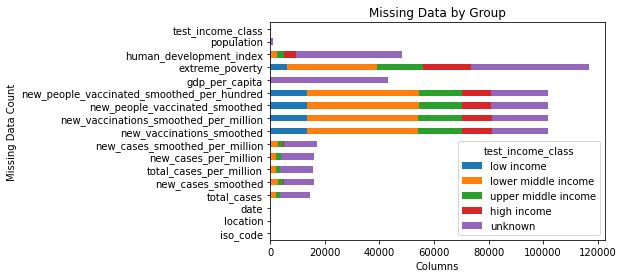

In [19]:
plt.figure(figsize=(20,20))
missing_counts = df.isnull().groupby(df['test_income_class']).sum()

# Transpose the new dataframe
missing_counts = missing_counts.T

# Create a stacked bar chart of the missing counts by income_class
missing_counts.plot(kind='barh', stacked=True)

# Add axis labels and a title
plt.xlabel('Columns')
plt.ylabel('Missing Data Count')
plt.title('Missing Data by Group')
plt.show()

We hypothesized earlier that higher income countries can provide better and more complete data due to availability of resources. This graph shows how much of the missing data per column is allocated to the different income classes

We can see that the unknown countries that we classified, which didn't have a GDP in the original table, have a lot of missing data, contribute to a lot of the missing data. This can impact our analysis, because we have a group that we cannot allocate.

In [20]:
category = 'unknown'
df[df['test_income_class'] == category].groupby('location').first().index

Index(['Andorra', 'Anguilla', 'Bonaire Sint Eustatius and Saba',
       'British Virgin Islands', 'Cook Islands', 'Cuba', 'Curacao', 'England',
       'Faeroe Islands', 'Falkland Islands', 'French Polynesia', 'Gibraltar',
       'Greenland', 'Guam', 'Guernsey', 'High income', 'International',
       'Isle of Man', 'Jersey', 'Liechtenstein', 'Low income',
       'Lower middle income', 'Monaco', 'Montserrat', 'New Caledonia', 'Niue',
       'North Korea', 'Northern Cyprus', 'Northern Ireland',
       'Northern Mariana Islands', 'Pitcairn', 'Saint Helena',
       'Saint Pierre and Miquelon', 'Scotland', 'Somalia', 'Syria', 'Taiwan',
       'Tokelau', 'Turks and Caicos Islands', 'United States Virgin Islands',
       'Upper middle income', 'Vatican', 'Wales', 'Wallis and Futuna',
       'Western Sahara'],
      dtype='object', name='location')

Here we show a list of the countries that we were not able to allocate in an income class

<AxesSubplot:xlabel='location'>

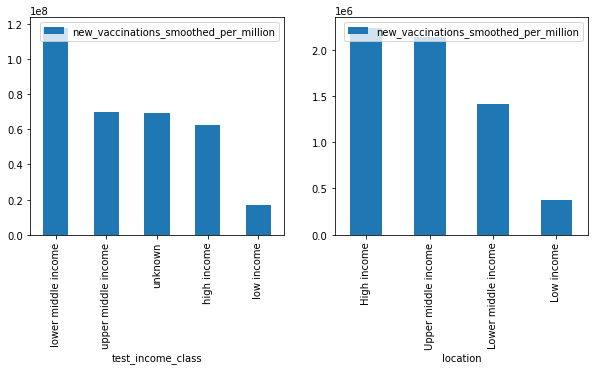

In [21]:
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(10,4))
df.groupby('test_income_class').sum(numeric_only=True).sort_values(by='new_vaccinations_smoothed_per_million', ascending=False).plot(kind='bar', y='new_vaccinations_smoothed_per_million', ax=ax1)
grouped_df.groupby('location').sum(numeric_only=True).sort_values(by='new_vaccinations_smoothed_per_million', ascending=False).plot(kind='bar', y='new_vaccinations_smoothed_per_million', ax=ax2)

Here we show the difference between the income classes made by us (first graph) and the income classes that were provided in the dataset. We can see that we have different results than provided by the dataset. However, now we can trace back which countries belong to which classification

# Vaccination Rate

A vaccination rate is the proportion of people vaccinated within a country

The vaccination rate is calculated using this [source](https://www.vzinfo.nl/bronnen-methoden-en-achtergronden/vaccinatie-vraag-en-antwoord#berekening)

<AxesSubplot:ylabel='location'>

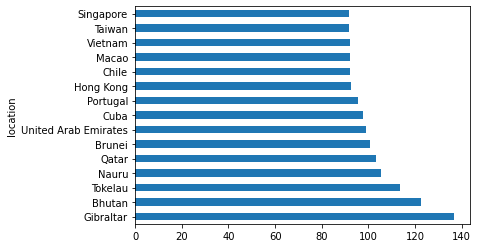

In [22]:
grouped_df = df.groupby("location")
total_vaccination = grouped_df["new_people_vaccinated_smoothed"].sum()
vaccination_rate = total_vaccination / (grouped_df["population"].mean()) *100

vaccination_rate.sort_values(ascending=False).head(15).plot(kind='barh')

Here you can see a graph with the countries with the highest vaccination rate. We see here that there are countries that have a higher percentage than 100%. We assume this is caused by different ways of reporting dosages of a vaccine. For example a country can report two dosages as one vaccine, when another country can count one dosage as an individual vaccine. We have to take this into account when we draw conclusions based on this data.

# GDP + vaccine

Now we are going to see if there are some intresting insights linked to GDP and vaccinations

In [23]:
grouped_df

In [24]:
df['vaccination_rate_per_day'] = (df['new_people_vaccinated_smoothed'] / df['population']) * 100

In [25]:
def select_country_data(location, df):
  return df.loc[df['location'] == location, ]

def visualize_country_data(location, df):
  country_data = select_country_data(location, df)
  income_class = country_data['test_income_class'].values[0]
  location = country_data['location'].values[0]

  chart = alt.Chart(country_data).mark_line().encode(
    x='yearmonth(date):T',
    y='vaccination_rate_per_day',
    tooltip = 'location', 
).interactive().properties(
title={
      "text": f"% of population vaccination per day in {location}", 
      "subtitle": f"This country is classified as {income_class}"
    }
  )
  display(chart)
  
interact(visualize_country_data, location=df['location'].unique(), df = fixed(df));

interactive(children=(Dropdown(description='location', options=('Afghanistan', 'Albania', 'Algeria', 'Andorra'…

This graph shows the percentage of the population of a country that gets vaccinated on a given day. In the graph above we can select a country we wish to have more information about. Then we can read in the subtitle in which income class this country belongs. In the graph you can then see how the vaccination rate increases over the COVID-19 period per country. 

In [26]:
# Define a function to plot the data for a selected country
def plot_country_data(df, country, start_date, end_date):
    if start_date is None:
        start_date = df["date"].tail(32).values[0]
    if end_date is None:
        end_date = df["date"].tail(1).values[0]

    start_date = pd.to_datetime(start_date)
    end_date = pd.to_datetime(end_date)
    
    country_data = df[(df["location"] == country)]
    income_class = country_data['test_income_class'].values[0]
    country_data = country_data[(country_data["date"] >= start_date) & (country_data["date"] <= end_date)]
    country_data.plot(kind='line', y='new_people_vaccinated_smoothed', x='date')
    # set the date on the x-axis to be dd-mm-yyyy
    
    plt.title(f"New Vaccinations in {country}\nThis country is classified as {income_class}")
    plt.xlabel("Date")
    plt.ylabel("New Vaccinations")
    plt.show()

# Create the dropdown widget for selecting a country
country_dropdown = widgets.Dropdown(
    options=df["location"].unique().tolist(),
    description='Country:'
)


date_start = widgets.DatePicker(
    description='Start Date',
    value = datetime.datetime.now() - datetime.timedelta(days=36)
)

date_end = widgets.DatePicker(
    description='End Date',
    value = datetime.datetime.now() - datetime.timedelta(days=5)
)


# Use the interact function to update the plot when a new country is selected
interact(plot_country_data, df=fixed(df), country=country_dropdown, start_date=date_start, end_date=date_end)

interactive(children=(Dropdown(description='Country:', options=('Afghanistan', 'Albania', 'Algeria', 'Andorra'…

<function __main__.plot_country_data(df, country, start_date, end_date)>

In this graph we see how many people are getting vaccinated per day. We can select a country in the drop-down menu, and after we can also select a period of time. This is handy if you want to zoom in on the timeline, to see changes within a specific period.

# Try-outs

In this section we played around with using different types of graphs


In [27]:
date_df = df.sort_values(by='date')
alt.Chart(date_df.head(3000)).mark_point().encode(
    x='date',
    y='mean(new_cases_smoothed)',
    color= 'test_income_class',
    tooltip = [ 'date', 'new_cases_smoothed', 'test_income_class' ],
    size = 'new_cases_smoothed',
)

alt.Chart(...)

This graph visualizes the amount of new cases of COVID per income class per day 

In [28]:
alt.Chart(date_df.head(3000)).mark_line().encode(
    x='date:T',
    y='new_cases_per_million',
    color='test_income_class'
).interactive()

alt.Chart(...)

# Total cases per country and GDP

In [29]:
alt.Chart(date_df.head(5000)).mark_area().encode(
    x='date:T',
    y='total_cases',
    color='location',
    tooltip=['date:T', 'total_cases', 'location']
).interactive().properties(title='Total cases of every location')

alt.Chart(...)

In this graph we show the total cases and the contribution per countrie. Be aware that in this table we did not take out the 'locations' of income yet, so these still contribute to the total cases.

In [30]:
alt.Chart(date_df.head(5000)).mark_area().encode(
    x='date:T',
    y='total_cases',
    color='gdp_per_capita',
    tooltip=['date:T', 'total_cases', 'gdp_per_capita']
).interactive().properties(title='Total cases of categorised by GDP')

alt.Chart(...)

In this graph we show the total cases and the contribution of the different levels of GDP per capita per country. The total cases are different within this graph compared to last, because the cases of the countries with missing values in the column `gdp_per_capita` are not included in the graph

#Conclusion

The research question we want to answer in this project is: 
- What effect does the wealth have on vaccination rate of a country?

In order to answer this question we will first answer shortly on the subquestions formulated: 

##Which countries have the highest / lowest GDP?

The top 5 countries with the highest gdp per capita are Qatar, Macao, Luxembourg, Singapore and Brunei

The 5 countries with the lowest gdp per capita are Central African Republic, Burundi, Liberia, Democratic Republic of Congo and Niger

##Which countries have the highest / lowest vaccination rate?
The top 5 countries with the highest vaccination rate are Gibraltar, Bhutan, Tokelau, Nauru and Qatar. Due to weird outcomes within our calculations, we are not sure if we can trust this data and thus we cannot answer this question with certainty

##Which countries have the highest / lowest testing rate?
We could not answer this question since our data on testing was not complete. The columns that gave data about testing all had more than 50% missing values, so we excluded this data from our analysis

## Is there a correlation between the different income classes and vaccination rate?
Within the graphs we can see that in the premade income classes the trend showed: the higher the income class, the more vaccinations. In our income classes however, we see that this trend is not right anymore. The differences can be caused by two reasons: 
- We did not use the same 'cuts' in deciding what gdp per capita belongs in what group
- The unknown data is not evenly spread over the different classes, which causes some groups to be a lot smaller than what they should be

##How do different income classes handle vaccinations?
We plotted two graphs in which we show vaccinations and vaccination rates per country. In here we can see how high the vaccination rates are in a specific country, in a specific time frame, and then also see to which income class the country belongs

#Contribution statement

Our collaboration went well both during the course and during the creation of the project. 
We often kept each other informed about new information, developments and deadlines of the course and the project. 
Besides, we often sat together to discuss all kinds of things about the project (both face-to-face and via Discord). As a result, we kept giving each other updates about what we have done, how far we have come and what we have encountered. This allowed us to communicate well with each other and exchange ideas. 
Although we missed some Python lessons due to overlaps in the schedule, we managed to give each other updates and help each other where it was needed.